In [112]:
import os
import copy
from tqdm import tqdm
import networkx as nx
import torch
import torch.nn as nn
import numpy as np
from torch_geometric.utils import to_networkx
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.utils import k_hop_subgraph
from torch_geometric.datasets import Planetoid
from torch_geometric.transforms import NormalizeFeatures
from tqdm import tqdm
import community as community_louvain
from networkx.algorithms.community import greedy_modularity_communities, label_propagation_communities, louvain_communities
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import optuna

os.environ['TORCH'] = torch.__version__
print(torch.__version__)

1.13.1+cu117


In [113]:
dataset = Planetoid(root='data/Planetoid', name='CiteSeer', transform=NormalizeFeatures())
print()
print(f'Dataset: {dataset}:')
print('======================')
print(f'Number of graphs: {len(dataset)}')
print(f'Number of features: {dataset.num_features}')
print(f'Number of classes: {dataset.num_classes}')

data = dataset[0]  # Get the first graph object.
print()
print('='*80)

# Gather some statistics about the graph.
print(f'Number of nodes: {data.num_nodes}')
print(f'Number of edges: {data.num_edges}')
print(f'Average node degree: {data.num_edges / data.num_nodes:.2f}')
print(f'Number of training nodes: {data.train_mask.sum()}')
print(f'Training node label rate: {int(data.train_mask.sum()) / data.num_nodes:.2f}')
print(f'Has isolated nodes: {data.has_isolated_nodes()}')
print(f'Has self-loops: {data.has_self_loops()}')
print(f'Is undirected: {data.is_undirected()}')


Dataset: CiteSeer():
Number of graphs: 1
Number of features: 3703
Number of classes: 6

Number of nodes: 3327
Number of edges: 9104
Average node degree: 2.74
Number of training nodes: 120
Training node label rate: 0.04
Has isolated nodes: True
Has self-loops: False
Is undirected: True


Processing...
Done!


In [114]:
data.x, torch.min(data.x), torch.max(data.x)

(tensor([[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]),
 tensor(0.),
 tensor(0.1250))

In [115]:
data.x.shape

torch.Size([3327, 3703])

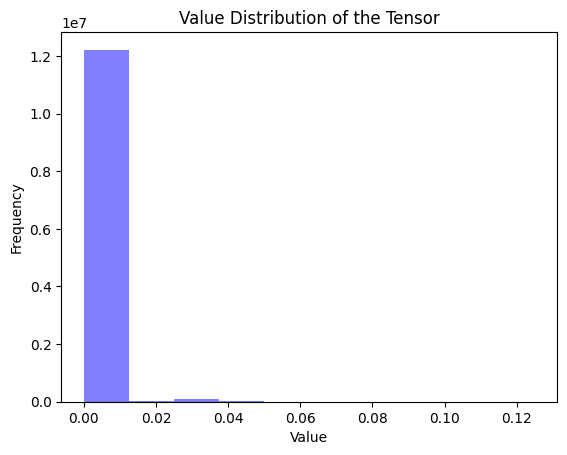

In [119]:
feats = data.x.numpy()
feats = feats.flatten()

# 创建直方图
plt.hist(feats, bins=10, color='blue', alpha=0.5)
plt.title('Value Distribution of the Tensor')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

Counter({3: 701, 2: 668, 4: 596, 1: 590, 5: 508, 0: 264})


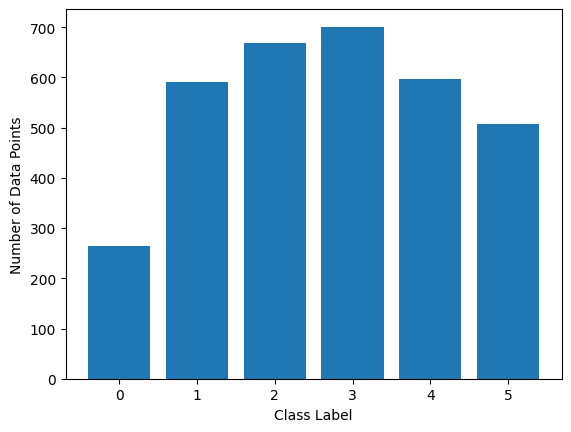

In [120]:
from collections import Counter
import numpy as np
labels = np.array(list(data.y))

# 假设 labels 是包含每个数据点类别的数组
label_counts = Counter(labels)
print(label_counts)

# 以柱状图形式显示每个类别的数据点数量
plt.bar(label_counts.keys(), label_counts.values())
plt.xlabel("Class Label")
plt.ylabel("Number of Data Points")
plt.show()


In [121]:
class GCN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        torch.manual_seed(42)
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)
        

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x1 = x.relu()
        x1 = F.dropout(x1, p=0.5, training=self.training)
        out = self.conv2(x1, edge_index)
        return x, out

In [122]:
model = GCN(data.num_features, 512, dataset.num_classes)
model

GCN(
  (conv1): GCNConv(3703, 512)
  (conv2): GCNConv(512, 6)
)

In [123]:
x, out = model(data.x, data.edge_index)
x, out, x.shape, out.shape

(tensor([[-0.0015,  0.0035,  0.0038,  ..., -0.0012, -0.0042, -0.0009],
         [ 0.0017,  0.0037,  0.0013,  ..., -0.0026, -0.0044,  0.0014],
         [ 0.0021,  0.0035, -0.0023,  ..., -0.0033,  0.0018, -0.0005],
         ...,
         [-0.0001,  0.0023, -0.0012,  ...,  0.0007,  0.0018,  0.0017],
         [ 0.0034, -0.0013, -0.0034,  ..., -0.0040, -0.0021,  0.0063],
         [ 0.0047, -0.0002, -0.0015,  ..., -0.0004,  0.0031,  0.0014]],
        grad_fn=<AddBackward0>),
 tensor([[-0.0034,  0.0025, -0.0043, -0.0004,  0.0005, -0.0029],
         [-0.0018,  0.0008,  0.0008,  0.0022,  0.0023,  0.0061],
         [-0.0071, -0.0025,  0.0010, -0.0003,  0.0045, -0.0018],
         ...,
         [-0.0007,  0.0004, -0.0005,  0.0005,  0.0005, -0.0002],
         [-0.0037,  0.0044, -0.0075, -0.0013,  0.0004,  0.0013],
         [-0.0035,  0.0021,  0.0004,  0.0015,  0.0017,  0.0020]],
        grad_fn=<AddBackward0>),
 torch.Size([3327, 512]),
 torch.Size([3327, 6]))

In [130]:
class ContrastiveLoss(nn.Module):
    def __init__(self, margin):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, class_probs, node_labels):
        # 使用标签来选择对应的分类概率
        selected_class_probs = class_probs[torch.arange(len(node_labels)), node_labels]
        
        # 计算正样本相似性（即分类概率）
        positive_similarity = selected_class_probs
        
        # 计算负样本相似性
        negative_indices = torch.randint(0, class_probs.size(0), (class_probs.size(0),))
        # 排除正样本的索引
        negative_indices[node_labels] = -1

        # 随机选择负样本
        while torch.any(negative_indices == -1):
            negative_indices = torch.randint(0, class_probs.size(0), (class_probs.size(0),))
            negative_indices[node_labels] = -1

        # 计算负样本相似性
        negative_similarity = class_probs[negative_indices]

        # 计算对比学习损失
        loss = torch.relu(self.margin - positive_similarity + negative_similarity).mean()

        return loss


In [131]:

from torch.optim.lr_scheduler import StepLR
import gc
import warnings
gc.collect()
warnings.filterwarnings('ignore')

# 超参数
margin = 1.0  # margin参数
hidden_dim = 512  # 嵌入维度
lr = 0.005

optimizer = torch.optim.Adam(model.parameters(), lr=0.005, weight_decay=5e-4)
scheduler = StepLR(optimizer, step_size=30, gamma=0.5)
cross_entropy = torch.nn.CrossEntropyLoss()
constrative = ContrastiveLoss(margin)


train_losses, val_losses = [], []
num_epochs = 50
for epoch in tqdm(range(num_epochs)):
    model.train()
    optimizer.zero_grad()
    out1, out2 = model(data.x, data.edge_index)
    loss = cross_entropy(out2, data.y)
    loss += constrative(out2, data.y)

    train_losses.append(loss)
    loss.backward()
    optimizer.step()


    # 模型验证
    best_val_acc = 0
    val_losses = []
    with torch.no_grad():
        model.eval()
        out1, out2 = model(data.x, data.edge_index)
        val_loss = cross_entropy(out2, data.y)
        val_loss += constrative(out2, data.y)
        val_losses.append(val_loss)

        val_pred = out2.argmax(dim=1)
        val_acc = accuracy(val_pred[data.val_mask], data.y[data.val_mask])

    # 更新学习率
    scheduler.step()

    if val_acc >= best_val_acc:
        best_val_acc = val_acc
        best_model = copy.deepcopy(model)
        torch.save(best_model.state_dict(), 'models/best_1030.pth')

    if epoch % 2 == 0:
            print(f'Epoch: {epoch:03d}, LR: {lr:.6f}, Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}, Val ACC: {val_acc:.4f}')




  0%|          | 0/50 [00:00<?, ?it/s]

In [11]:
feats_sim = cosine_similarity(feats, feats)
feats_sim, feats_sim.shape

(array([[0.9999999 , 0.0695048 , 0.0764719 , ..., 0.07856742, 0.17817415,
         0.18490003],
        [0.0695048 , 0.99999994, 0.14350946, ..., 0.09829464, 0.05572782,
         0.05783148],
        [0.0764719 , 0.14350946, 0.9999999 , ..., 0.10814761, 0.06131393,
         0.06362846],
        ...,
        [0.07856742, 0.09829464, 0.10814761, ..., 1.        , 0.        ,
         0.06537203],
        [0.17817415, 0.05572782, 0.06131393, ..., 0.        , 0.99999994,
         0.14824985],
        [0.18490003, 0.05783148, 0.06362846, ..., 0.06537203, 0.14824985,
         0.99999976]], dtype=float32),
 (2708, 2708))

#### 初始特征相似性

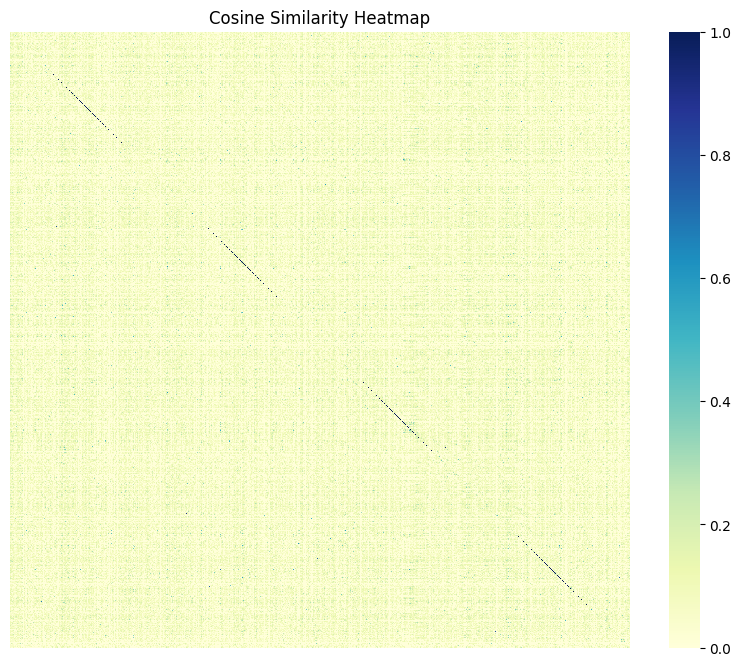

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.heatmap(feats_sim, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("Cosine Similarity Heatmap")
plt.show()

In [13]:
wo_diagonal_feats_sim = feats_sim.copy()
np.fill_diagonal(wo_diagonal_feats_sim, 0)
wo_diagonal_feats_sim, wo_diagonal_feats_sim.shape


(array([[0.        , 0.0695048 , 0.0764719 , ..., 0.07856742, 0.17817415,
         0.18490003],
        [0.0695048 , 0.        , 0.14350946, ..., 0.09829464, 0.05572782,
         0.05783148],
        [0.0764719 , 0.14350946, 0.        , ..., 0.10814761, 0.06131393,
         0.06362846],
        ...,
        [0.07856742, 0.09829464, 0.10814761, ..., 0.        , 0.        ,
         0.06537203],
        [0.17817415, 0.05572782, 0.06131393, ..., 0.        , 0.        ,
         0.14824985],
        [0.18490003, 0.05783148, 0.06362846, ..., 0.06537203, 0.14824985,
         0.        ]], dtype=float32),
 (2708, 2708))

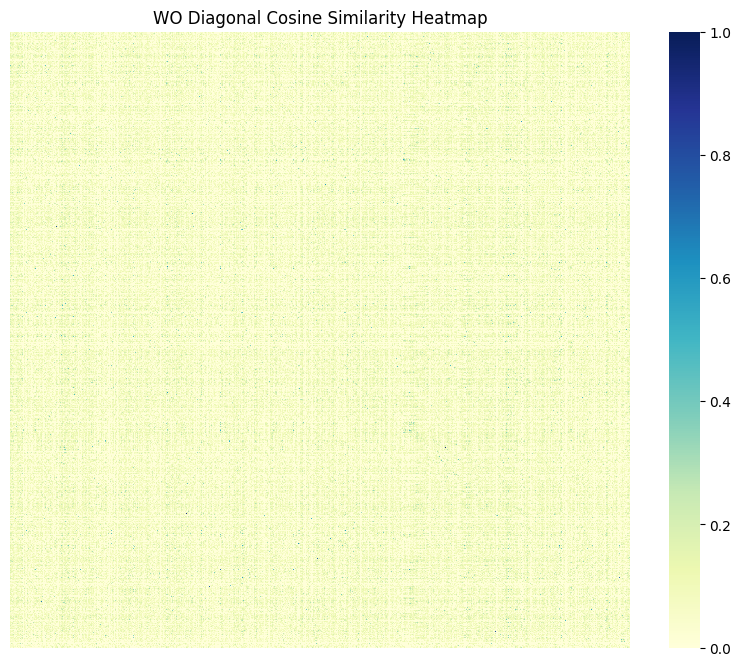

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.heatmap(wo_diagonal_feats_sim, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("WO Diagonal Cosine Similarity Heatmap")
plt.show()

#### 一层GCN之后的节点特征

In [15]:
out1_sim = cosine_similarity(out1.detach().numpy(), out1.detach().numpy())
out1_sim, out1_sim.shape

(array([[1.        , 0.23521209, 0.33725536, ..., 0.09788267, 0.3417853 ,
         0.37264544],
        [0.23521209, 1.        , 0.5537871 , ..., 0.15069522, 0.24265032,
         0.22754475],
        [0.33725536, 0.5537871 , 0.9999999 , ..., 0.17280638, 0.3757453 ,
         0.33230418],
        ...,
        [0.09788267, 0.15069522, 0.17280638, ..., 0.99999976, 0.13468505,
         0.08494931],
        [0.3417853 , 0.24265032, 0.3757453 , ..., 0.13468505, 0.9999999 ,
         0.89321774],
        [0.37264544, 0.22754475, 0.33230418, ..., 0.08494931, 0.89321774,
         0.9999999 ]], dtype=float32),
 (2708, 2708))

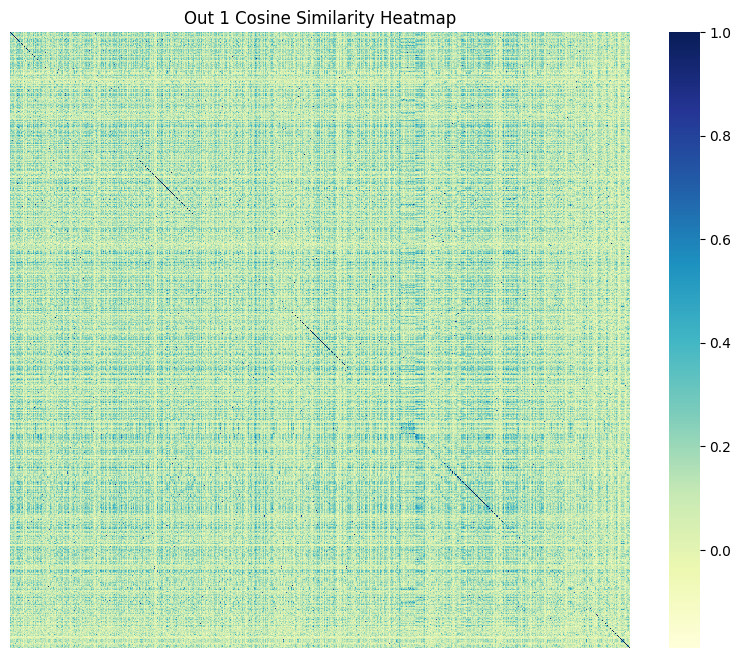

In [16]:
plt.figure(figsize=(10, 8))
sns.heatmap(out1_sim, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("Out 1 Cosine Similarity Heatmap")
plt.show()

#### 两层GCN之后的节点特征

In [17]:
out2_sim = cosine_similarity(out2.detach().numpy(), out2.detach().numpy())
out2_sim, out2_sim.shape

(array([[ 0.99999994,  0.39169076,  0.7004462 , ...,  0.1959148 ,
          0.74322706,  0.6669333 ],
        [ 0.39169076,  0.9999998 , -0.14775464, ...,  0.32692873,
         -0.15714547, -0.29095677],
        [ 0.7004462 , -0.14775464,  1.        , ..., -0.27367285,
          0.86625373,  0.921939  ],
        ...,
        [ 0.1959148 ,  0.32692873, -0.27367285, ...,  0.9999999 ,
          0.1516404 , -0.06863843],
        [ 0.74322706, -0.15714547,  0.86625373, ...,  0.1516404 ,
          0.9999999 ,  0.9076634 ],
        [ 0.6669333 , -0.29095677,  0.921939  , ..., -0.06863843,
          0.9076634 ,  1.0000001 ]], dtype=float32),
 (2708, 2708))

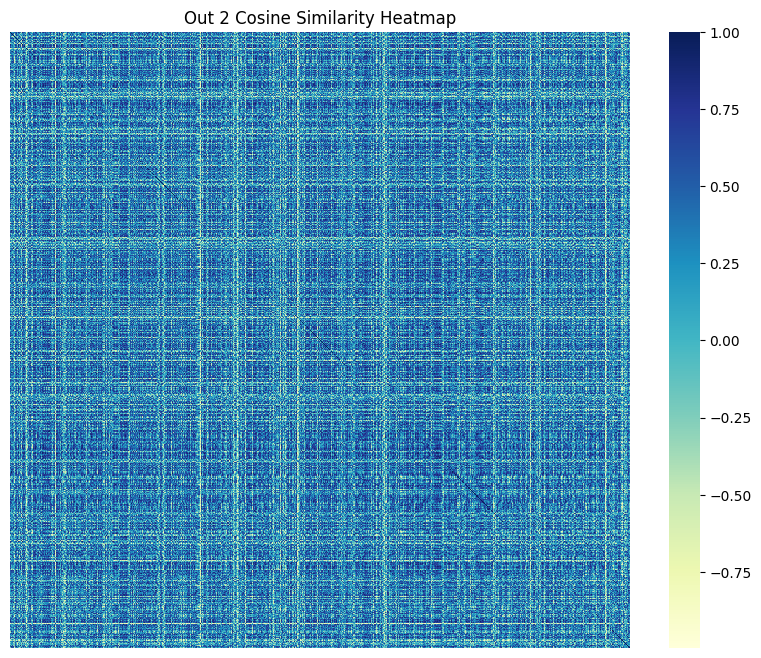

In [18]:
plt.figure(figsize=(10, 8))
sns.heatmap(out2_sim, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("Out 2 Cosine Similarity Heatmap")
plt.show()

In [78]:
model3 = GCN3(data.num_features, 512, 64, dataset.num_classes)
model3

GCN3(
  (conv1): GCNConv(1436, 512)
  (conv2): GCNConv(512, 64)
  (conv3): GCNConv(64, 7)
)

In [79]:
x1, x2, x3 = model3(data.x, data.edge_index)
x1, x1.shape

RuntimeError: expected scalar type Double but found Float

In [ ]:
sim1 = cosine_similarity(x1.detach().numpy(), x1.detach().numpy())
sim2 = cosine_similarity(x2.detach().numpy(), x2.detach().numpy())
sim3 = cosine_similarity(x3.detach().numpy(), x3.detach().numpy())

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(sim1, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("Out 1 Cosine Similarity Heatmap--GCN3")
plt.show()

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(sim2, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("Out 2 Cosine Similarity Heatmap--GCN3")
plt.show()

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(sim3, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("Out 3 Cosine Similarity Heatmap--GCN3")
plt.show()

In [ ]:
np.mean(sim1), np.mean(sim2), np.mean(sim3)

In [15]:
def visualize(h, color):
    z = TSNE(n_components=2).fit_transform(h.detach().cpu().numpy())

    plt.figure(figsize=(10,10))
    plt.xticks([])
    plt.yticks([])

    plt.scatter(z[:, 0], z[:, 1], s=70, c=color, cmap="Set2")
    plt.show()

In [16]:
visualize(x3, color=data.y)

NameError: name 'x3' is not defined

In [19]:
# 查看图指标的相关性
G = nx.Graph()
for i in range(data.edge_index.shape[1]):
    source = data.edge_index[0, i].item()
    target = data.edge_index[1, i].item()
    G.add_edge(source, target)

# 计算节点的度、聚类系数和约束
deg = np.array(list(dict(G.degree()).values()))
clu = np.array(list(nx.clustering(G).values()))
con = np.array(list(nx.constraint(G).values()))

In [20]:
dcc = np.concatenate((deg.reshape(-1, 1), clu.reshape(-1, 1), con.reshape(-1, 1)), axis=1)
dcc_sim = cosine_similarity(dcc, dcc)
dcc_sim, dcc_sim.shape

(array([[1.        , 0.99999744, 0.99507327, ..., 0.80553864, 0.80553864,
         0.80553864],
        [0.99999744, 1.        , 0.99523258, ..., 0.8042064 , 0.8042064 ,
         0.8042064 ],
        [0.99507327, 0.99523258, 1.        , ..., 0.76494971, 0.76494971,
         0.76494971],
        ...,
        [0.80553864, 0.8042064 , 0.76494971, ..., 1.        , 1.        ,
         1.        ],
        [0.80553864, 0.8042064 , 0.76494971, ..., 1.        , 1.        ,
         1.        ],
        [0.80553864, 0.8042064 , 0.76494971, ..., 1.        , 1.        ,
         1.        ]]),
 (2708, 2708))

In [21]:
deg, clu, con, dcc, dcc.shape

(array([3, 3, 4, ..., 1, 1, 1]),
 array([0.33333333, 0.33333333, 0.16666667, ..., 0.        , 0.        ,
        0.        ]),
 array([0.48225309, 0.47524552, 0.34722222, ..., 1.        , 1.        ,
        1.        ]),
 array([[3.        , 0.33333333, 0.48225309],
        [3.        , 0.33333333, 0.47524552],
        [4.        , 0.16666667, 0.34722222],
        ...,
        [1.        , 0.        , 1.        ],
        [1.        , 0.        , 1.        ],
        [1.        , 0.        , 1.        ]]),
 (2708, 3))

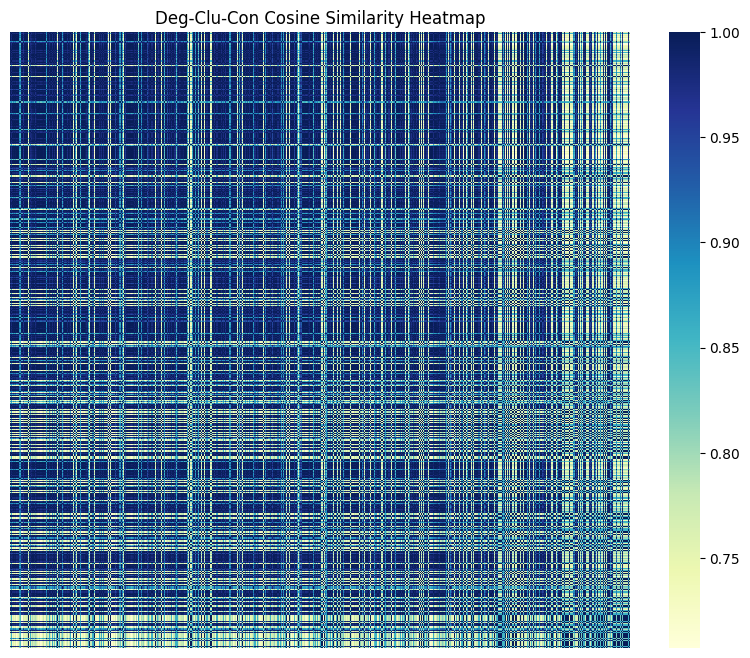

In [22]:
plt.figure(figsize=(10, 8))
sns.heatmap(dcc_sim, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("Deg-Clu-Con Cosine Similarity Heatmap")
plt.show()

In [23]:
dcc_l = np.concatenate((dcc, data.y.detach().numpy().reshape(-1,1)), axis=1)
dcc_l, dcc_l.shape

(array([[3.        , 0.33333333, 0.48225309, 3.        ],
        [3.        , 0.33333333, 0.47524552, 4.        ],
        [4.        , 0.16666667, 0.34722222, 4.        ],
        ...,
        [1.        , 0.        , 1.        , 3.        ],
        [1.        , 0.        , 1.        , 3.        ],
        [1.        , 0.        , 1.        , 3.        ]]),
 (2708, 4))

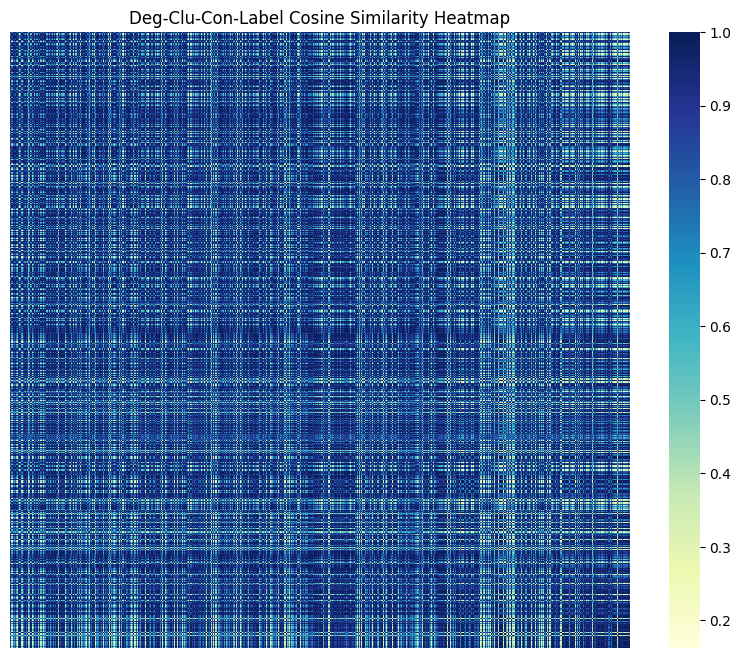

In [24]:
dcc_l_sim = cosine_similarity(dcc_l, dcc_l)
plt.figure(figsize=(10, 8))
sns.heatmap(dcc_l_sim, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("Deg-Clu-Con-Label Cosine Similarity Heatmap")
plt.show()

#### 将图结构特征当成输入，最后效果会怎样？

In [25]:
model1 = GCN(data.x.shape[1], 8, dataset.num_classes)
model1

GCN(
  (conv1): GCNConv(1433, 8)
  (conv2): GCNConv(8, 7)
)

In [26]:
g_x1, g_x2 = model1(data.x, data.edge_index)
g_x1, g_x1.shape

(tensor([[ 0.0020,  0.0020, -0.0018,  ...,  0.0005, -0.0111, -0.0048],
         [-0.0014,  0.0045,  0.0133,  ..., -0.0083, -0.0081,  0.0001],
         [ 0.0011,  0.0032,  0.0049,  ..., -0.0035, -0.0089, -0.0064],
         ...,
         [-0.0096, -0.0049, -0.0206,  ..., -0.0017,  0.0040, -0.0028],
         [ 0.0008,  0.0052,  0.0002,  ...,  0.0034,  0.0031, -0.0001],
         [-0.0003,  0.0008, -0.0043,  ...,  0.0023, -0.0011, -0.0010]],
        grad_fn=<AddBackward0>),
 torch.Size([2708, 8]))

In [27]:
g1_sim = cosine_similarity(g_x1.detach().numpy(), g_x1.detach().numpy())
g1_sim

array([[ 1.0000001 ,  0.3877628 ,  0.5940305 , ...,  0.1060457 ,
         0.42611763,  0.6439218 ],
       [ 0.3877628 ,  1.0000001 ,  0.7188352 , ..., -0.58622605,
         0.06378946, -0.21928206],
       [ 0.5940305 ,  0.7188352 ,  1.        , ..., -0.3988203 ,
        -0.06393251,  0.09082826],
       ...,
       [ 0.1060457 , -0.58622605, -0.3988203 , ...,  1.        ,
         0.07039567,  0.5500855 ],
       [ 0.42611763,  0.06378946, -0.06393251, ...,  0.07039567,
         1.        ,  0.6052845 ],
       [ 0.6439218 , -0.21928206,  0.09082826, ...,  0.5500855 ,
         0.6052845 ,  0.99999994]], dtype=float32)

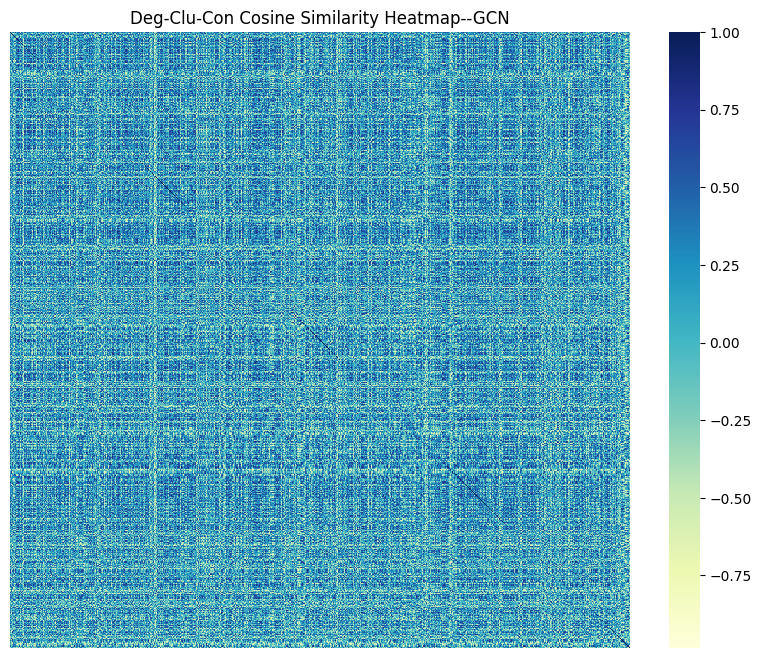

In [28]:
plt.figure(figsize=(10, 8))
sns.heatmap(g1_sim, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("Deg-Clu-Con Cosine Similarity Heatmap--GCN")
plt.show()

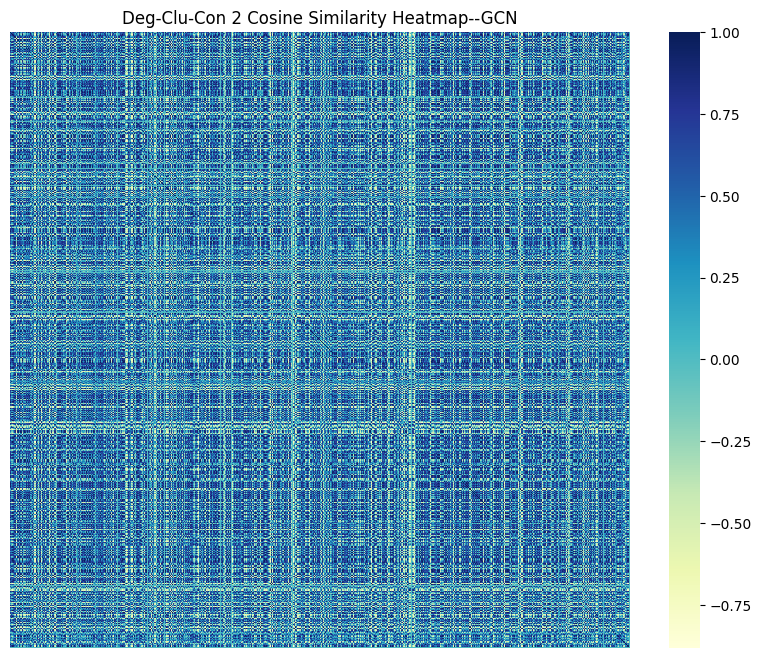

In [29]:
g2_sim = cosine_similarity(g_x2.detach().numpy(), g_x2.detach().numpy())
plt.figure(figsize=(10, 8))
sns.heatmap(g2_sim, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("Deg-Clu-Con 2 Cosine Similarity Heatmap--GCN")
plt.show()

#### 将图原始特征和属性特征放在一起会怎么样

In [30]:
hybrid_feats = torch.cat((feats, torch.tensor(dcc, dtype=torch.double)), dim=1)
hybrid_feats, hybrid_feats.shape

(tensor([[0.0000, 0.0000, 0.0000,  ..., 3.0000, 0.3333, 0.4823],
         [0.0000, 0.0000, 0.0000,  ..., 3.0000, 0.3333, 0.4752],
         [0.0000, 0.0000, 0.0000,  ..., 4.0000, 0.1667, 0.3472],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 1.0000, 0.0000, 1.0000],
         [0.0000, 0.0000, 0.0000,  ..., 1.0000, 0.0000, 1.0000],
         [0.0000, 0.0000, 0.0000,  ..., 1.0000, 0.0000, 1.0000]],
        dtype=torch.float64),
 torch.Size([2708, 1436]))

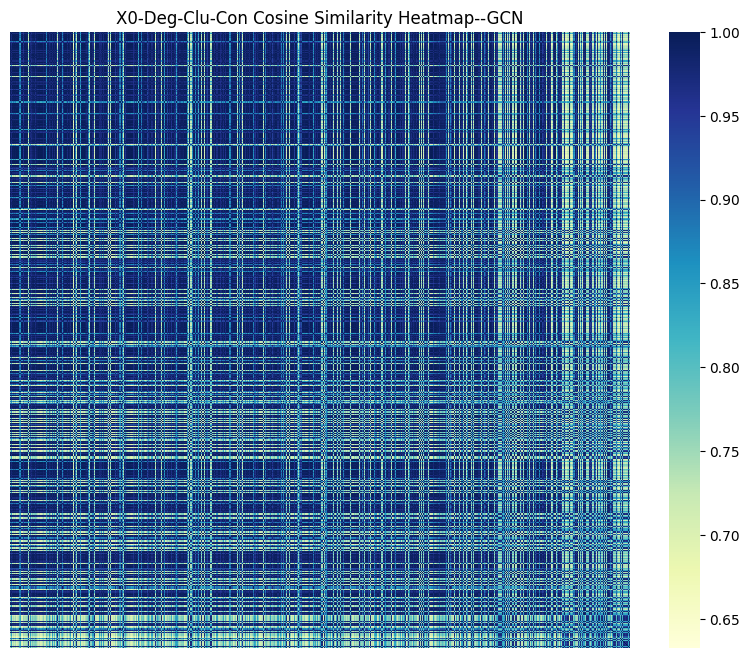

In [31]:
h0_sim = cosine_similarity(hybrid_feats.detach().numpy(), hybrid_feats.detach().numpy())
plt.figure(figsize=(10, 8))
sns.heatmap(h0_sim, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("X0-Deg-Clu-Con Cosine Similarity Heatmap--GCN")
plt.show()

In [32]:
data.x = hybrid_feats

In [33]:
model1 = GCN(data.x.shape[1], 8, dataset.num_classes).double()
model1

GCN(
  (conv1): GCNConv(1436, 8)
  (conv2): GCNConv(8, 7)
)

In [34]:
g_h1, g_h2 = model1(data.x, data.edge_index)

In [35]:
g_h1

tensor([[ 0.1352,  0.0929, -0.0099,  ..., -0.0125,  0.0571,  0.1864],
        [ 0.1893,  0.1375,  0.0059,  ...,  0.0025,  0.0725,  0.2423],
        [ 0.1541,  0.1024,  0.0033,  ...,  0.0021,  0.0716,  0.2171],
        ...,
        [ 0.0607,  0.0389, -0.0319,  ..., -0.0405,  0.0557,  0.1260],
        [ 0.1711,  0.1308,  0.0013,  ..., -0.0140,  0.0623,  0.2416],
        [ 0.0956,  0.0790, -0.0104,  ..., -0.0220,  0.0493,  0.1649]],
       dtype=torch.float64, grad_fn=<AddBackward0>)

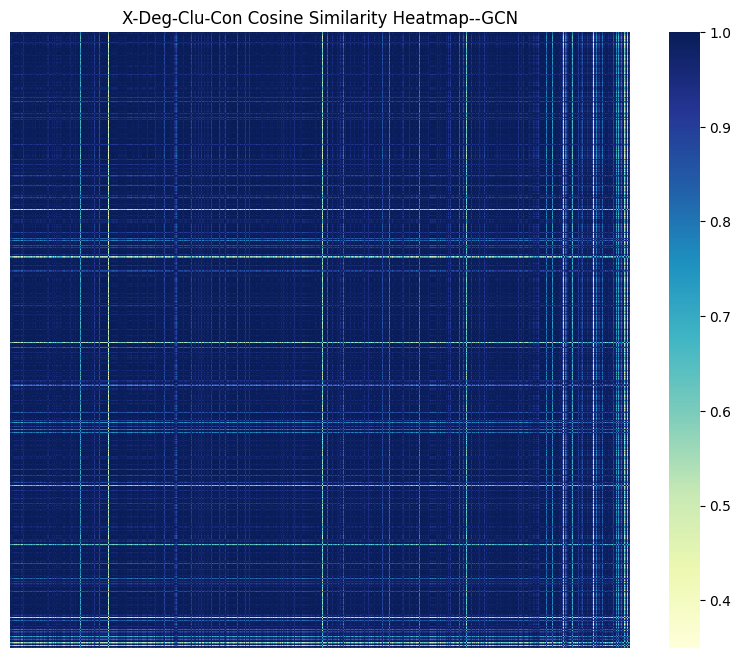

In [36]:
h1_sim = cosine_similarity(g_h1.detach().numpy(), g_h1.detach().numpy())
plt.figure(figsize=(10, 8))
sns.heatmap(h1_sim, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("X-Deg-Clu-Con Cosine Similarity Heatmap--GCN")
plt.show()

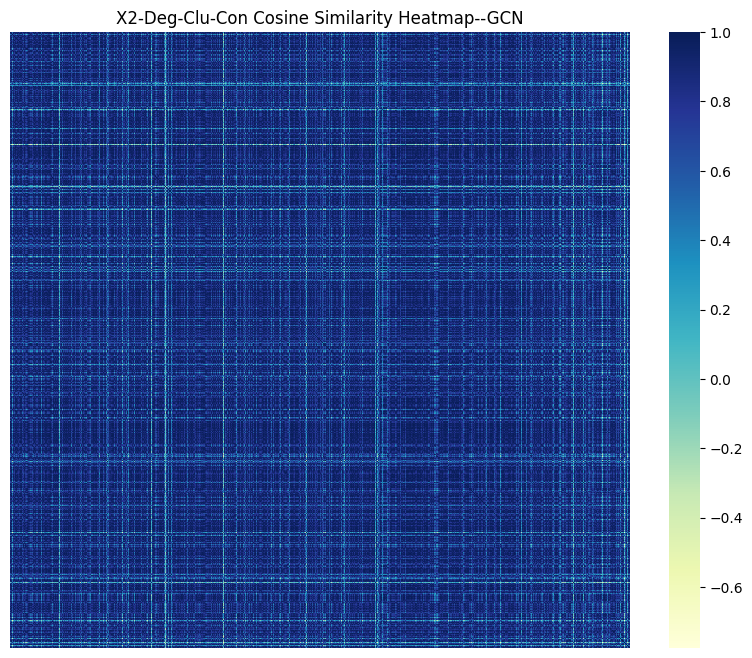

In [37]:
h2_sim = cosine_similarity(g_h2.detach().numpy(), g_h2.detach().numpy())
plt.figure(figsize=(10, 8))
sns.heatmap(h2_sim, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("X2-Deg-Clu-Con Cosine Similarity Heatmap--GCN")
plt.show()

/tmp/ipykernel_1574156/69430104.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(similarity_matrix.flatten(), shade=True)


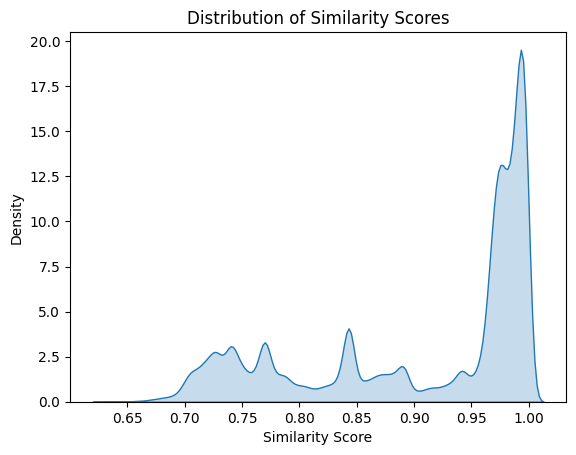

Mean Similarity: 0.9069269166401579
Variance of Similarity: 0.010105768972217388
Median Similarity: 0.9686024537298072


In [42]:
def statistic(similarity_matrix):
    # 绘制核密度估计图
    sns.kdeplot(similarity_matrix.flatten(), shade=True)
    plt.xlabel("Similarity Score")
    plt.ylabel("Density")
    plt.title("Distribution of Similarity Scores")
    plt.show()
    mean_similarity = np.mean(similarity_matrix)
    var_similarity = np.var(similarity_matrix)
    median_similarity = np.median(similarity_matrix)

    print("Mean Similarity:", mean_similarity)
    print("Variance of Similarity:", var_similarity)
    print("Median Similarity:", median_similarity)

statistic(h0_sim)

/tmp/ipykernel_1574156/69430104.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(similarity_matrix.flatten(), shade=True)


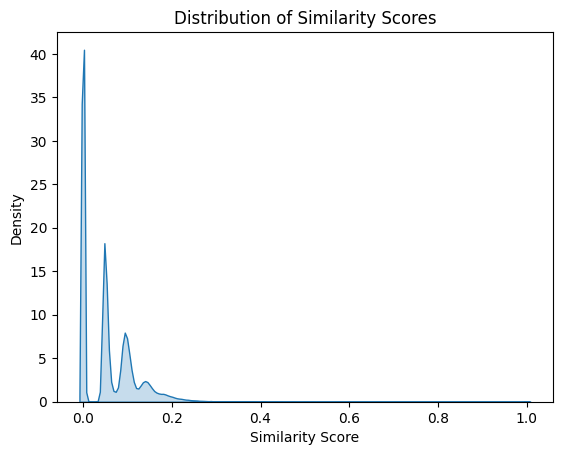

Mean Similarity: 0.05610723
Variance of Similarity: 0.0038478342
Median Similarity: 0.048795003


In [43]:
statistic(feats_sim)

/tmp/ipykernel_1574156/69430104.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(similarity_matrix.flatten(), shade=True)


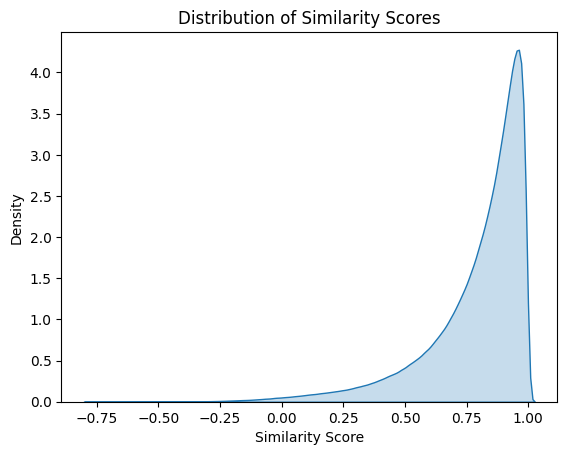

Mean Similarity: 0.7889648478710499
Variance of Similarity: 0.04197484358717053
Median Similarity: 0.8558690831302331


In [44]:
statistic(h2_sim)

/tmp/ipykernel_1574156/69430104.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(similarity_matrix.flatten(), shade=True)


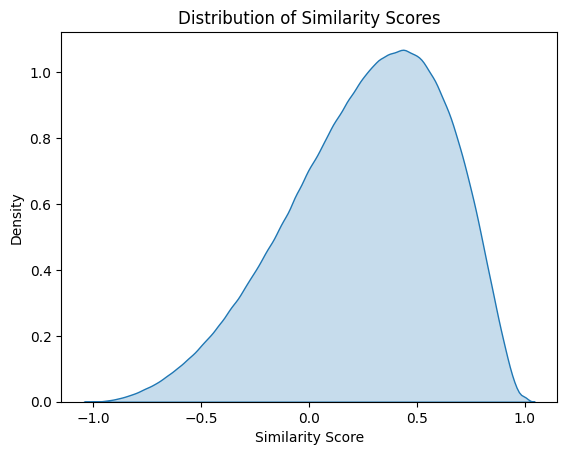

Mean Similarity: 0.2639668
Variance of Similarity: 0.12969002
Median Similarity: 0.3041542


In [46]:
statistic(out2_sim)

In [52]:
import numpy as np
labels = np.array(list(data.y))
labels

array([3, 4, 4, ..., 3, 3, 3])

In [53]:
from collections import Counter

# 假设 labels 是包含每个数据点类别的数组
label_counts = Counter(labels)
print(label_counts)


Counter({3: 818, 4: 426, 2: 418, 0: 351, 5: 298, 1: 217, 6: 180})


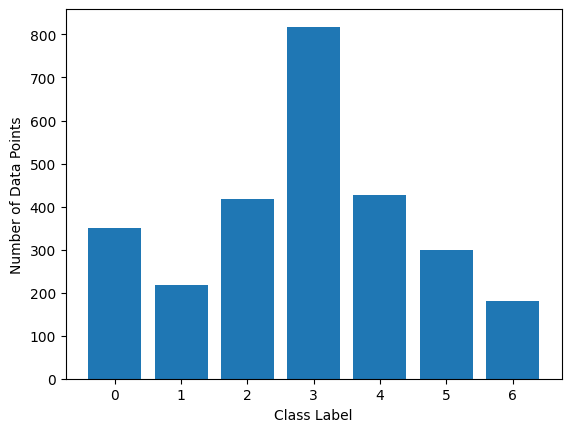

In [54]:
# 以柱状图形式显示每个类别的数据点数量
plt.bar(label_counts.keys(), label_counts.values())
plt.xlabel("Class Label")
plt.ylabel("Number of Data Points")
plt.show()


In [56]:
# 3个结构特征和label的相关系数
# 计算皮尔逊相关系数
r = np.corrcoef(con, labels)[0, 1]
print("皮尔逊相关系数:", r)

皮尔逊相关系数: 0.01330707449767972


In [57]:
r = np.corrcoef(deg, labels)[0, 1]
print("皮尔逊相关系数:", r)

皮尔逊相关系数: 0.007824032591232892


In [58]:
r = np.corrcoef(clu, labels)[0, 1]
print("皮尔逊相关系数:", r)

皮尔逊相关系数: 0.004086823379306778


In [66]:
for i in range(feats.shape[1]):
    r = np.corrcoef(feats[:,i], labels)[0, 1]
    print("皮尔逊相关系数:", r)

皮尔逊相关系数: 0.03718462562071052
皮尔逊相关系数: 0.01910494962958542
皮尔逊相关系数: -0.0061349484328997025
皮尔逊相关系数: -0.04982454683869022
皮尔逊相关系数: 0.1747665078076194
皮尔逊相关系数: -0.0026730366378024625
皮尔逊相关系数: -0.05124677458506691
皮尔逊相关系数: 0.002624005998571132
皮尔逊相关系数: 0.028368396114014698
皮尔逊相关系数: -0.028028568108795615
皮尔逊相关系数: -0.022171092473826773
皮尔逊相关系数: -0.006829641444279647
皮尔逊相关系数: 0.05132389814308945
皮尔逊相关系数: -0.005077608104762801
皮尔逊相关系数: 0.003081579668191405
皮尔逊相关系数: -0.0035470577815353626
皮尔逊相关系数: 0.03367935968917264
皮尔逊相关系数: 0.011070129677074766
皮尔逊相关系数: 0.026759039616232022
皮尔逊相关系数: 0.014369447933286414
皮尔逊相关系数: 0.01602750437459574
皮尔逊相关系数: -0.052450501611514676
皮尔逊相关系数: 0.02309123147497461
皮尔逊相关系数: 0.0014777866672179012
皮尔逊相关系数: -0.01910769001157529
皮尔逊相关系数: -0.004533394294019973
皮尔逊相关系数: 0.035941437616895264
皮尔逊相关系数: 0.011579980230339793
皮尔逊相关系数: 0.019790269738460042
皮尔逊相关系数: -0.06235296233963594
皮尔逊相关系数: 0.10384626942645898
皮尔逊相关系数: 0.031556086737050806
皮尔逊相关系数: 0.003529159430943026
皮尔逊相关系

/users/Min/miniconda/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/users/Min/miniconda/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


#### 互信息计算

In [67]:
# 定义离散化函数
def discretize(data, num_bins):
    # 使用分位数将数据分桶为离散值
    quantiles = np.percentile(data, np.arange(0, 100, 100 / num_bins))
    return np.digitize(data, quantiles)

In [96]:
# # 离散化初始特征和GCN嵌入
# from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
# from sklearn.feature_selection import mutual_info_classif

# def cal_mi(feats, g_x1):
#     if not feats.shape[1] ==  g_x1.shape[1]:
#         # 创建一个LDA对象，将数据映射到2维
#         lda = LinearDiscriminantAnalysis(n_components=2)

#         # 将数据1和数据2映射到相同的低维空间
#         feats = lda.fit_transform(feats, [1] * feats.shape[0])  # 数据1的标签设为1
#         g_x1 = lda.transform(g_x1.detach().numpy())

#         # 计算映射后的数据之间的互信息
#         mi = mutual_info_classif(feats, g_x1)

#         # num_bins = 10  # 分成10个桶
#         # dis_fea = discretize(feats, num_bins)
#         # dis_emb = discretize(g_x1, num_bins)


#         # print(dis_fea.shape, dis_emb.shape)
#         # # 计算互信息
#         # joint_dis = np.histogram2d(dis_fea, dis_emb, bins=num_bins)[0]
#         # mar_features = np.histogram(dis_fea, bins=num_bins)[0]
#         # mar_embedding = np.histogram(dis_emb, bins=num_bins)[0]

#         # # 使用SciPy计算互信息
#         # mi = entropy(joint_dis, base=2) - entropy(mar_features, base=2) - entropy(mar_embedding, base=2)

#         print("Mutual Information:", mi)

    
#     else:
#         num_bins = 10  # 分成10个桶
#         dis_fea = discretize(feats, num_bins)
#         dis_emb = discretize(g_x1.detach().numpy(), num_bins)


#         print(dis_fea.shape, dis_emb.shape)
#         # 计算互信息
#         joint_dis = np.histogram2d(dis_fea, dis_emb, bins=num_bins)[0]
#         mar_features = np.histogram(dis_fea, bins=num_bins)[0]
#         mar_embedding = np.histogram(dis_emb, bins=num_bins)[0]

#         # 使用SciPy计算互信息
#         mi = entropy(joint_dis, base=2) - entropy(mar_features, base=2) - entropy(mar_embedding, base=2)

#         print("Mutual Information:", mi)


In [99]:
feats, feats.shape, out1, out1.shape

(tensor([[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]),
 torch.Size([2708, 1433]),
 tensor([[-3.3069e-03,  3.0336e-03, -8.2643e-05,  ...,  9.7422e-03,
          -1.2546e-03,  1.7954e-03],
         [-6.8662e-04,  7.2435e-04,  7.2692e-04,  ...,  7.7303e-03,
          -9.6039e-03,  2.3449e-03],
         [-3.9829e-03, -2.7937e-03,  4.0546e-03,  ...,  3.8518e-03,
          -9.6650e-03,  2.5171e-03],
         ...,
         [-8.4599e-03,  1.0597e-02, -6.5246e-03,  ...,  3.5326e-03,
           1.1099e-03, -1.3867e-04],
         [-5.7998e-03,  2.2888e-03,  8.2108e-04,  ...,  1.1853e-02,
          -6.2438e-03, -7.9215e-03],
         [-2.0731e-03,  3.4990e-03, -2.5164e-03,  ...,  9.1183e-03,
          -5.3811e-03, -6.0525e-03]], grad_fn=<AddBackward0>),
 torch.Size([2708, 512]))

In [104]:
from sklearn.metrics import mutual_info_score

# 将emb1和emb2按列拼接，得到一个(2708, 1441)大小的矩阵
combined = np.hstack((feats, out2.detach().numpy()))

# 计算互信息
mi = mutual_info_score(None, None, contingency=combined)
print("Mutual Information:", mi)

Mutual Information: 0.0


In [108]:
from sklearn.metrics import mutual_info_score

# 将emb1和emb2按列拼接，得到一个(2708, 1441)大小的矩阵
combined = np.hstack((dcc_l, out2.detach().numpy()))

# 计算互信息
mi = mutual_info_score(None, None, contingency=combined)
print("Mutual Information:", mi)

Mutual Information: 0.21682962946972278


/users/Min/miniconda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 25490 (\N{CJK UNIFIED IDEOGRAPH-6392}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/users/Min/miniconda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 21517 (\N{CJK UNIFIED IDEOGRAPH-540D}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/users/Min/miniconda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 29305 (\N{CJK UNIFIED IDEOGRAPH-7279}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/users/Min/miniconda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 24449 (\N{CJK UNIFIED IDEOGRAPH-5F81}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/users/Min/miniconda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 32034 (\N{CJK UNIFIED IDEOGRAPH-7D22}) missing from current fon

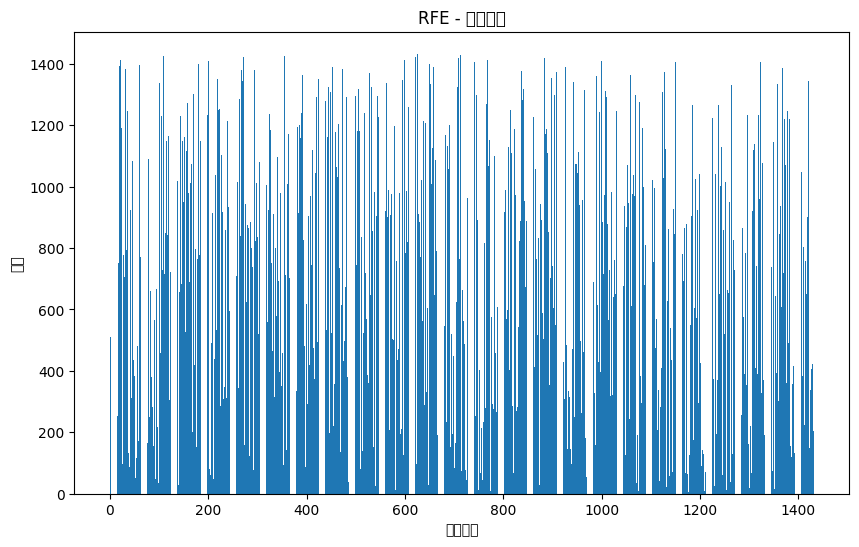

Selected Features: [495]


In [111]:
import numpy as np 
import matplotlib.pyplot as plt 
from sklearn.datasets import load_iris 
from sklearn.model_selection import train_test_split 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.feature_selection import RFE

# 将数据集拆分为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(feats, labels, test_size= 0.2 , random_state= 42 ) 

# 创建随机森林分类器作为基础模型
model = RandomForestClassifier(n_estimators= 100 , random_state= 42 ) 

# 使用 RFE 指定要选择的特征数量
num_features_to_select = 1 

# 使用模型和要选择的特征数量初始化 RFE
rfe = RFE(estimator=model, n_features_to_select=num_features_to_select) 

#将 RFE 拟合到训练数据
rfe.fit(X_train, y_train) 

# 获取每个特征的排名
feature_ranking = rfe.ranking_ 

# 获取选定的特征 selected_features
selected_features = np.where(feature_ranking == 1)[0]


# 可视化特征排名
plt.figure(figsize=( 10 , 6 )) 
plt.title( "RFE - 特征排名" ) 
plt.xlabel( "特征索引" ) 
plt.ylabel( "排名" ) 
plt.bar( range ( len (feature_ranking) ), feature_ranking) 
plt.show() 

# 打印选定的特征
print ( "Selected Features:" , selected_features) 


In [ ]:
from torch_geometric.data import Data

def community_detection(data, model_name, resolution):
    # Step 1: Convert Cora dataset to a NetworkX graph
    G = nx.Graph()
    for i in range(data.edge_index.shape[1]):
        source = data.edge_index[0, i].item()
        target = data.edge_index[1, i].item()
        G.add_edge(source, target)

    # Step 2: Apply Louvain community detection
    if model_name == 'louvain':
        partition = louvain_communities(G, resolution)
    elif model_name == 'greedy_modularity':
        communities = greedy_modularity_communities(G)
        partition = {}
        for idx, community in enumerate(communities):
            for node in community:
                partition[node] = idx
    partition1 = {}
    for index, item in enumerate(partition):
        for value in item:
            partition1[value] = index
    unique_partitions = np.unique(list(partition1.values()))
    # Step 3: Create a new graph based on community assignments
    # unique_partitions = np.unique(list(partition.values()))
    community_masks = torch.zeros((data.num_nodes, len(unique_partitions)), dtype=torch.float32)
    subgraphs = []

    for idx, community_id in enumerate(unique_partitions):
        nodes_in_community = [node for node, community in partition1.items() if community == community_id]
        community_masks[nodes_in_community, idx] = 1

        # Extract subgraph for each community
        community_subgraph = G.subgraph(nodes_in_community)
        community_edges = torch.tensor(list(community_subgraph.edges)).t().contiguous()
        community_edge_index = torch.cat([community_edges, community_edges.flip(0)], dim=-1)
        community_data = Data(
            x=data.x[nodes_in_community],
            edge_index=community_edge_index,
            y=data.y[nodes_in_community],
            train_mask=data.train_mask[nodes_in_community],
            val_mask=data.val_mask[nodes_in_community],
            test_mask=data.test_mask[nodes_in_community]
        )
        subgraphs.append(community_data)

    return partition1, community_masks, subgraphs

In [ ]:
import torch_geometric.transforms as T

# Load the Cora dataset
cora_dataset = Planetoid(root='cora', name='Cora', transform=T.NormalizeFeatures())
data = cora_dataset[0]

# Apply community detection
partition, community_masks, subgraphs = community_detection(data, model_name='louvain', resolution=0.5)


In [ ]:
partition

In [ ]:
community_masks, community_masks.shape

In [ ]:
subgraphs[0]

In [ ]:
class GCN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        torch.manual_seed(42)
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = x.relu()
        x = F.dropout(x, p=0.5, training=self.training)
        out = self.conv2(x, edge_index)
        return x, out

In [ ]:
model = GCN(data.num_features, 512, dataset.num_classes)
model

In [ ]:
x, out = model(data.x, data.edge_index)
x, x.shape

In [ ]:
out, out.shape

In [ ]:
community_masks, community_masks[:,0], community_masks[:,1]

In [ ]:
x, x[0,:]

In [ ]:
rows = []
cols = torch.arange(community_masks.size(1))
for col in cols:
    row = (community_masks[:, col] == 1).nonzero().view(-1)
    rows.append(row)

rows

In [ ]:
x[rows[-1][0],:], x[rows[-1][1],:], x[rows[-1][0],:].shape, x[rows[-1][1],:].shape

In [ ]:
input1,input2 = x[rows[-2][0],:].unsqueeze(dim=1), x[rows[-1][1],:].unsqueeze(dim=1)

simi_tensor = F.cosine_similarity(input1,input2, dim=1, eps=1e-8)
dist_tensor = 1 - simi_tensor

simi_tensor, dist_tensor, simi_tensor.shape

In [ ]:
torch.mean(simi_tensor), torch.mean(dist_tensor)

In [ ]:
data.y[rows[-2][0]], data.y[rows[-1][1]]

In [ ]:
model

In [ ]:
# optimizer = torch.optim.Adam(model.parameters(), lr=0.005, weight_decay=5e-4)
# scheduler = StepLR(optimizer, step_size=30, gamma=0.5)
# cross_entropy = torch.nn.CrossEntropyLoss()

In [ ]:
node_idx = torch.arange(data.x.size(0)).unsqueeze(dim=0)
node_idx, node_idx.shape

In [ ]:
community_masks.shape

In [ ]:
def visualize(h, color):
    z = TSNE(n_components=2).fit_transform(h.detach().cpu().numpy())

    plt.figure(figsize=(10,10))
    plt.xticks([])
    plt.yticks([])

    plt.scatter(z[:, 0], z[:, 1], s=70, c=color, cmap="Set2")
    plt.savefig('figs/cora_1025.png')


def accuracy(y_pred, y_true):
    
    correct = y_pred.eq(y_true).double()
    correct = correct.sum().item()
    return correct / len(y_true)

### 关键思路：
1. 找到节点所属社团（在community_mask里通过行号关联找到非零列号）；
2. 计算节点表示和（根据非零列号索引集合对应的）相同社团节点表示两者的相似性和距离，同时可以计算不同社团之间的相似性和距离，我们希望相同社团的相似性高，不同社团对应的相似性低；
3. 基于此构造loss函数中的归一化项，然后结合交叉熵用于节点分类，实现模型的训练和学习；


In [ ]:
# 先构建社团图
def construct_community_graph(edges, community_assignments):

    # 1. 创建新的社团图
    community_graph = nx.Graph()

    # 2. 添加社团节点
    for community_id in set(community_assignments.values()):
        community_graph.add_node(community_id)

    # 3. 构建社团之间的连接关系
    for edge in edges:
        node1, node2 = edge
        community1, community2 =community_assignments.get(node1, None), community_assignments.get(node2, None)

        # 确保节点属于哪个社团
        if community1 is not None and community2 is not None:
            if community1 != community2:
                # 社团1和社团2之间没有边，添加一条边
                if not community_graph.has_edge(community1, community2):
                    community_graph.add_edge(community1, community2)

    # 这里采用社团图的最短路径距离
    community_distances = dict(nx.all_pairs_shortest_path_length(community_graph))

    # 对于每个社团，根据最短距离选取离得最远的社团并返回各自对应的社团编号
    max_dis_communities = {}
    for com in community_distances:
        sorted_items = sorted(community_distances[com].items(), key=lambda item: item[1], reverse=True)
        max_com = sorted_items[0][0]
        max_dis_communities[com] = max_com

    return community_graph, community_distances, max_dis_communities




# 示例数据
edges = [(1, 2), (1, 3), (2, 4), (2, 3), (4, 5), (4, 6), (5, 6), (7, 8)]
community_assignments = {1: 0, 2: 0, 3: 0, 4: 1, 5: 1, 6: 1}

# 构建社团图和计算社团之间的距离
community_graph, community_distances, max_dis_communities = construct_community_graph(edges, community_assignments)



# 输出社团图和社团之间的距离
print("社团图的节点：", community_graph.nodes)
print("社团之间的距离：", community_distances)
print("对应最远社团：", max_dis_communities)

In [ ]:
G = nx.Graph()
for i in range(data.edge_index.shape[1]):
    source = data.edge_index[0, i].item()
    target = data.edge_index[1, i].item()
    G.add_edge(source, target)
print(nx.components.is_connected(G))
list(G.edges)

In [ ]:
# 只考虑不同社团的情况
def get_neg_node(data, node, partition, rows):

    # Step 1: Convert Cora dataset to a NetworkX graph
    G = nx.Graph()
    for i in range(data.edge_index.shape[1]):
        source = data.edge_index[0, i].item()
        target = data.edge_index[1, i].item()
        G.add_edge(source, target)
    edges = list(G.edges)

    # 选取最远距离的社团对应的节点作为负样本
    community_graph, community_distances, max_dis_communities = construct_community_graph(edges, partition)

    # print(community_distances)
    # print()
    # print(max_dis_communities)

    # 创建一个新的字典，值是列表
    flipped_partition = {}
    for key, value in partition.items():
        if value not in flipped_partition:
            flipped_partition[value] = [key]
        else:
            flipped_partition[value].append(key)

    # print(flipped_partition)
    
    neg_node = []
    if len(neg_node) == rows.shape[0]:
        neg_node = torch.stack(neg_node)
        return neg_node
    
    else:
        
        neg_node = flipped_partition[max_dis_communities[partition[node.item()]]]
        neg_node = torch.tensor(neg_node)
        # print(neg_node)
        if not node in neg_node:
            # if neg_node.size(0) <= 1:
            #     return neg_node
            # else:
            #     neg_node = torch.stack(neg_node)
            return neg_node
            
        else:
            neg_node = []
            for target_node in torch.arange(data.x.size(0)):
                if target_node != node:
                    if torch.eq(rows, target_node).any():
                        continue
                    else:
                        neg_node.append(target_node)
                if len(neg_node) == rows.shape[0]:
                    break
            
            neg_node = torch.stack(neg_node)
            return neg_node

# # 只考虑不同社团的情况
# def get_neg_node(data, node, row):
#     neg_node = []
#     if len(neg_node) == row.size(0):
#         neg_node = torch.stack(neg_node)
#         return neg_node
            
#     else:
#         for target_node in torch.arange(data.x.size(0)):
#             if target_node != node:
#                 if torch.eq(row, target_node).any():
#                     continue
#                 else:
#                     neg_node.append(target_node)
#             if len(neg_node) == row.size(0):
#                 break
        
#         neg_node = torch.stack(neg_node)
#         # print('*'*100)
#         # print(neg_node, neg_node.shape)
#         return neg_node

# def get_neg_node(data, node, row):
#     # 创建一个布尔掩码，标记哪些节点是正样本
#     is_positive = torch.zeros(data.num_nodes, dtype=torch.bool)
#     is_positive[row] = True

#     # 通过异或操作找到负样本节点
#     is_negative = ~is_positive

#     # 去除自身节点
#     is_negative[node] = False

#     # 获取负样本节点的索引
#     neg_node = torch.nonzero(is_negative, as_tuple=False).squeeze()
#     print('*'*100)
#     print(neg_node, neg_node.shape)
#     return neg_node


In [ ]:
subgraphs[0], subgraphs[1]

In [ ]:
from torch.optim.lr_scheduler import StepLR
import gc
import warnings
gc.collect()
warnings.filterwarnings('ignore')

def objective(trial):
    alpha = trial.suggest_float('alpha', 0.01, 0.5)
    lr = trial.suggest_float('lr', 1e-5, 1e-2)

    model = GCN(data.num_features, 512, dataset.num_classes)
    best_val_acc = 0
    num_epochs = 100
    optimizer = torch.optim.Adam(model.parameters(), lr=0.005, weight_decay=5e-4)
    scheduler = StepLR(optimizer, step_size=30, gamma=0.5)
    cross_entropy = torch.nn.CrossEntropyLoss()
    for epoch in tqdm(range(num_epochs)):
        model.train()
        optimizer.zero_grad()
        emb, out = model(data.x, data.edge_index)
        loss1 = cross_entropy(out[data.train_mask], data.y[data.train_mask])
        same_com_cos_sim, diff_com_cos_sim = [], []
        
        emb = emb - torch.mean(emb)
        train_losses = []
        for node in torch.arange(data.x.size(0))[data.train_mask]:
            # for the same community
            col = (community_masks[node, :] == 1).nonzero().view(-1)
            
            rows = (community_masks[:, col] == 1).nonzero()[:,0].view(-1)
        
            cos_sims = []
            for row in rows:
                if node != row:
                    cos_sim = torch.cosine_similarity(emb[node,:], emb[row,:], dim=0)
                    cos_sims.append(cos_sim)
            cos_sims = torch.stack(cos_sims)
            cos_sims = F.normalize(cos_sims, dim=0)
            # print(cos_sims, cos_sims.shape)
            cos_sims = torch.mean(cos_sims)
            
            same_com_cos_sim.append(cos_sims.unsqueeze(dim=0))

            # for different communities
            neg_node = get_neg_node(data, node, partition, rows)
            neg_cos_sims = []
            for neg in neg_node:
                neg_cos_sim = F.cosine_similarity(emb[node,:], emb[neg,:], dim=0)
                neg_cos_sims.append(neg_cos_sim)
            neg_cos_sims = torch.stack(neg_cos_sims)
            neg_cos_sims = F.normalize(neg_cos_sims, dim=0)
            neg_cos_sims = torch.mean(neg_cos_sims)
            
            diff_com_cos_sim.append(neg_cos_sims.unsqueeze(dim=0))

        
        same_com_cos_sim = torch.stack(same_com_cos_sim)
        same_com_cos_sim = same_com_cos_sim.squeeze(dim=1)
        same_com_dis = 1 - same_com_cos_sim

        diff_com_cos_sim = torch.stack(diff_com_cos_sim)
        diff_com_cos_sim = diff_com_cos_sim.squeeze(dim=1)

        diff_com_dis = 1 - diff_com_cos_sim

        loss2 = diff_com_dis - same_com_dis
        loss2 = torch.mean(loss2)
        

        loss = torch.mean(loss1) - alpha * loss2
        train_losses.append(loss)
        # print('=======loss:')
        # print(loss, loss1, loss2)
        # loss  =loss1
        loss.backward()
        optimizer.step()


        # 模型验证
        best_val_acc = 0
        val_losses = []
        with torch.no_grad():
            model.eval()
            emb, out = model(data.x, data.edge_index)
            emb = emb - torch.mean(emb)
            val_loss1 = cross_entropy(out[data.val_mask], data.y[data.val_mask])
            same_com_cos_sim, diff_com_cos_sim = [], []
            for node in torch.arange(data.x.size(0))[data.val_mask]:
                # for nodes from the same community
                col = (community_masks[node, :] == 1).nonzero().view(-1)
                rows = (community_masks[:, col] == 1).nonzero()[:,0].view(-1)

                cos_sims = []
                for row in rows:
                    if node != row:
                        cos_sim = torch.cosine_similarity(emb[node,:], emb[row,:], dim=0)
                        cos_sims.append(cos_sim)

                cos_sims = torch.stack(cos_sims)
                cos_sims = F.normalize(cos_sims, dim=0)
                cos_sims = torch.mean(cos_sims)
                same_com_cos_sim.append(cos_sims.unsqueeze(dim=0))

                # for nodes from different communities
                neg_node = get_neg_node(data, node, partition, rows)
                neg_cos_sims = []
                for neg in neg_node:
                    neg_cos_sim = F.cosine_similarity(emb[node,:], emb[neg,:], dim=0)
                    neg_cos_sims.append(neg_cos_sim)
                neg_cos_sims = torch.stack(neg_cos_sims)
                neg_cos_sims = F.normalize(neg_cos_sims, dim=0)
                neg_cos_sims = torch.mean(neg_cos_sims)
                
                diff_com_cos_sim.append(neg_cos_sims.unsqueeze(dim=0))

            same_com_cos_sim = torch.stack(same_com_cos_sim)
            same_com_cos_sim = same_com_cos_sim.squeeze(dim=1)
            same_com_dis = 1 - same_com_cos_sim

            diff_com_cos_sim = torch.stack(diff_com_cos_sim)
            diff_com_cos_sim = diff_com_cos_sim.squeeze(dim=1)
            diff_com_dis = 1 - diff_com_cos_sim
            

            val_loss2 = diff_com_dis - same_com_dis
            val_loss2 = torch.mean(val_loss2)
            
            val_loss = torch.mean(val_loss1) - alpha * val_loss2
            val_losses.append(val_loss.item())
            # print(val_loss, val_loss1, val_loss2)
            
            val_pred = out.argmax(dim=1)
            val_acc = accuracy(val_pred[data.val_mask], data.y[data.val_mask])
        # 更新学习率
        scheduler.step()
        
        if val_acc >= best_val_acc:
            best_val_acc = val_acc
            best_model = copy.deepcopy(model)
            torch.save(best_model.state_dict(), 'models/best_1026.pth')

        if epoch % 2 == 0:
                print(f'Epoch: {epoch:03d}, Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}, Val ACC: {val_acc:.4f}')

    return best_val_acc



In [ ]:
# create a study object to manage the optimization
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=3)

# get the best hyperparameters from the optimization
best_alpha = study.best_params['alpha']
best_lr = study.best_params['lr']
print(f'best alphs: {best_alpha}')
print(f'best lr: {best_lr}')

In [ ]:
best_lr = 0.25
best_alpha = 0.0025

In [ ]:
import torch.optim as optim

lr = best_lr
alpha = best_alpha
model = GCN(data.num_features, 512, dataset.num_classes)
optimizer = optim.Adam([{'params': model.parameters()}], lr=lr)
scheduler = StepLR(optimizer, step_size=30, gamma=0.5)
cross_entropy = torch.nn.CrossEntropyLoss()


num_epochs = 10
for epoch in tqdm(range(num_epochs)):
    model.train()
    optimizer.zero_grad()
    emb, out = model(data.x, data.edge_index)
    loss1 = cross_entropy(out[data.train_mask], data.y[data.train_mask])
    same_com_cos_sim, diff_com_cos_sim = [], []
    
    emb = emb - torch.mean(emb)
    train_losses = []
    for node in torch.arange(data.x.size(0))[data.train_mask]:
        # for the same community
        col = (community_masks[node, :] == 1).nonzero().view(-1)
        
        rows = (community_masks[:, col] == 1).nonzero()[:,0].view(-1)
    
        cos_sims = []
        for row in rows:
            if node != row:
                cos_sim = torch.cosine_similarity(emb[node,:], emb[row,:], dim=0)
                cos_sims.append(cos_sim)
        cos_sims = torch.stack(cos_sims)
        cos_sims = F.normalize(cos_sims, dim=0)
        # print(cos_sims, cos_sims.shape)
        cos_sims = torch.mean(cos_sims)
        
        same_com_cos_sim.append(cos_sims.unsqueeze(dim=0))

        # for different communities
        neg_node = get_neg_node(data, node, partition, rows)
        neg_cos_sims = []
        for neg in neg_node:
            neg_cos_sim = F.cosine_similarity(emb[node,:], emb[neg,:], dim=0)
            neg_cos_sims.append(neg_cos_sim)
        neg_cos_sims = torch.stack(neg_cos_sims)
        neg_cos_sims = F.normalize(neg_cos_sims, dim=0)
        neg_cos_sims = torch.mean(neg_cos_sims)
        
        diff_com_cos_sim.append(neg_cos_sims.unsqueeze(dim=0))

    
    same_com_cos_sim = torch.stack(same_com_cos_sim)
    same_com_cos_sim = same_com_cos_sim.squeeze(dim=1)
    same_com_dis = 1 - same_com_cos_sim

    diff_com_cos_sim = torch.stack(diff_com_cos_sim)
    diff_com_cos_sim = diff_com_cos_sim.squeeze(dim=1)

    diff_com_dis = 1 - diff_com_cos_sim

    loss2 = diff_com_dis - same_com_dis
    loss2 = torch.mean(loss2)
    

    loss = torch.mean(loss1) - alpha * loss2
    train_losses.append(loss)
    # print('=======loss:')
    # print(loss, loss1, loss2)
    # loss  =loss1
    loss.backward()
    optimizer.step()


    # 模型验证
    best_val_acc = 0
    val_losses = []
    with torch.no_grad():
        model.eval()
        emb, out = model(data.x, data.edge_index)
        emb = emb - torch.mean(emb)
        val_loss1 = cross_entropy(out[data.val_mask], data.y[data.val_mask])
        same_com_cos_sim, diff_com_cos_sim = [], []
        for node in torch.arange(data.x.size(0))[data.val_mask]:
            # for nodes from the same community
            col = (community_masks[node, :] == 1).nonzero().view(-1)
            rows = (community_masks[:, col] == 1).nonzero()[:,0].view(-1)

            cos_sims = []
            for row in rows:
                if node != row:
                    cos_sim = torch.cosine_similarity(emb[node,:], emb[row,:], dim=0)
                    cos_sims.append(cos_sim)

            cos_sims = torch.stack(cos_sims)
            cos_sims = F.normalize(cos_sims, dim=0)
            cos_sims = torch.mean(cos_sims)
            same_com_cos_sim.append(cos_sims.unsqueeze(dim=0))

            # for nodes from different communities
            neg_node = get_neg_node(data, node, partition, rows)
            neg_cos_sims = []
            for neg in neg_node:
                neg_cos_sim = F.cosine_similarity(emb[node,:], emb[neg,:], dim=0)
                neg_cos_sims.append(neg_cos_sim)
            neg_cos_sims = torch.stack(neg_cos_sims)
            neg_cos_sims = F.normalize(neg_cos_sims, dim=0)
            neg_cos_sims = torch.mean(neg_cos_sims)
            diff_com_cos_sim.append(neg_cos_sims.unsqueeze(dim=0))

        same_com_cos_sim = torch.stack(same_com_cos_sim)
        same_com_cos_sim = same_com_cos_sim.squeeze(dim=1)
        same_com_dis = 1 - same_com_cos_sim

        diff_com_cos_sim = torch.stack(diff_com_cos_sim)
        diff_com_cos_sim = diff_com_cos_sim.squeeze(dim=1)
        diff_com_dis = 1 - diff_com_cos_sim
        

        val_loss2 = diff_com_dis - same_com_dis
        val_loss2 = torch.mean(val_loss2)
        
        val_loss = torch.mean(val_loss1) - alpha * val_loss2
        val_losses.append(val_loss.item())
        # print(val_loss, val_loss1, val_loss2)
        
        val_pred = out.argmax(dim=1)
        val_acc = accuracy(val_pred[data.val_mask], data.y[data.val_mask])
    # 更新学习率
    scheduler.step()
    
    if val_acc >= best_val_acc:
        best_val_acc = val_acc
        best_model = copy.deepcopy(model)
        torch.save(best_model.state_dict(), 'models/best_1026.pth')

    if epoch % 2 == 0:
            print(f'Epoch: {epoch:03d}, LR: {lr:.6f}, Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}, Val ACC: {val_acc:.4f}')


In [ ]:
# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.savefig('figs/loss_1025.png')

In [ ]:
model.eval()
model = best_model
emb, out = model(data.x, data.edge_index)
test_pred = out.argmax(dim=1)
test_acc = accuracy(test_pred[data.test_mask], data.y[data.test_mask])
print(f'Test Accuracy: {test_acc:.4f}')